# LIBRARIES

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import yaml
import time
import os
import pandas as pd
## Import torch
import torch
from torch.utils.data import TensorDataset, DataLoader
from neuralsens.partial_derivatives import calculate_second_partial_derivatives_mlp
from sklearn.model_selection import train_test_split
from scipy.spatial import Voronoi

import sys
sys.path.insert(0,'../Scripts/')

from Utilities import *
import Utilities
import LipVor_functions
from LipVor_functions import *


from generate_data import generate_data_Neumann
from train import train
from DNN import DNN
import random

## Plotly render
import plotly
from IPython.display import display, HTML

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

## Load autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# DATA VISUALIZATION

In [28]:
########## BOUNDARY CONDITIONS ##########
torch.manual_seed(0)
np.random.seed(0)
random.seed(0)
L=1.0
k=0.5
N_train=2
N_test=30
T=1.0
seed=0
generate_data_Neumann(L, k, N_train, N_test, T,seed,lambda t: t)
t_test = np.linspace(0, T, N_test)
## load data
X_tensor = torch.load('../Data/X_test_data.pt')
y_tensor = torch.load('../Data/y_test_data.pt')
## Added some noise
noise = torch.randn_like(y_tensor) * 0.02
y_tensor_real = y_tensor
y_tensor = y_tensor + noise

##
## Select N*N random points for training/validation and the rest for test
N = 30
idx = np.random.choice(len(X_tensor), N, replace=False)
print(idx[:3])
N_train = N*80//100
X_tensor_red = X_tensor[idx[:N_train]]
## Concatenate
y_tensor_red = y_tensor[idx[:N_train]]

## The rest goes to external
X_val_ext = X_tensor[idx[N_train:]]
y_val_ext = y_tensor[idx[N_train:]]

## Train Test split from X_test_tensor
X_train_tensor, X_test_tensor, y_train_tensor, y_test_tensor = train_test_split(X_tensor_red, y_tensor_red, test_size=0.20, random_state=2023)

## Save data
torch.save(X_train_tensor,'../Data/X_train_data.pt')
torch.save(X_test_tensor,'../Data/X_test_data.pt')
torch.save(y_train_tensor,'../Data/y_train_data.pt')
torch.save(y_test_tensor,'../Data/y_test_data.pt')


## Convertimos los datos a un dataset para pytorch
n_samples = len(X_train_tensor)
train_dt = TensorDataset(X_train_tensor,y_train_tensor) # create your datset
train_dataload = DataLoader(train_dt,batch_size=64) # create your dataloader

## Convertimos los datos a un dataset para pytorch
n_samples = len(X_test_tensor)
val_dt = TensorDataset(X_test_tensor,y_test_tensor) # create your datset
val_dataload = DataLoader(val_dt,batch_size=n_samples) # create your dataloader


[252 817 144]


In [29]:
## LOAD AND PLOT DATA
X_train_tensor = torch.load('../Data/X_train_data.pt')
X_test_tensor = torch.load('../Data/X_test_data.pt')
y_train_tensor = torch.load('../Data/y_train_data.pt')
y_test_tensor = torch.load('../Data/y_test_data.pt')


x_test = np.linspace(0, L, N_test)


scatter_train = go.Scatter3d(
    x=X_train_tensor[:, 0],
    y=X_train_tensor[:, 1],
    z=y_train_tensor[:, 0],
    mode='markers',
    marker=dict(size=5, opacity=0.7, color='blue'),
    name='Train Data'
)

scatter_test = go.Scatter3d(
    x=X_test_tensor[:, 0],
    y=X_test_tensor[:, 1],
    z=y_test_tensor[:, 0],
    mode='markers',
    marker=dict(size=5, opacity=0.7, color='red'),
    name='Validation Data'
)

scatter_val_ext = go.Scatter3d(
    x=X_val_ext[:, 0],
    y=X_val_ext[:, 1],
    z=y_val_ext[:, 0],
    mode='markers',
    marker=dict(size=5, opacity=0.7, color='green'),
    name='Test Data'
)


u_test = y_tensor_real.reshape(N_test, N_test)
surface_true = go.Surface(x=t_test, y=x_test, z=u_test, opacity=0.5, colorscale='Blues', showscale=False, name='True Function')

# Crear el gráfico
fig = go.Figure(data=[scatter_test, scatter_train,scatter_val_ext, surface_true])
fig.update_layout(scene=dict(xaxis_title='t', yaxis_title='x', zaxis_title='u(t,x)'),
                  width=1000,  # Cambia el ancho de la figura
                  height=800,
                  legend=dict(x=-0.1, y=1.0, font=dict(size=16)))  # Ajusta el tamaño del texto de la leyenda
fig.show()

# MODELLING

#### GRID SEARCH

In [39]:
# Load grid_search results
grid_search_results = pd.read_csv('../logs/errors_log_heat.csv')
# Generate one column which is the different in MAE between MAE_Train and MAE_Val
grid_search_results['MAE_Diff'] = (grid_search_results['MAE_Train'] - grid_search_results['MAE_Val']).abs()
# Generate one column which is the different in R2 between R2_Train and R2_Val
grid_search_results['R2_Diff'] = (grid_search_results['R2_Train'] - grid_search_results['R2_Val']).abs()
# Sort first by MAE_Diff and then by MAE_Val
grid_search_results.sort_values(['MAE_Val','R2_Val','MAE_Diff',], ascending=[True,True,False],inplace=True)
# print the unique layer configurations
print(grid_search_results['Layers'].unique())
# print the unique lr, weight_decay configurations
print(grid_search_results['lr'].unique())
print(grid_search_results['weight_decay'].unique())
# Reset index
grid_search_results.reset_index(drop=True, inplace=True)
grid_search_results.head(5)

['[2, 10, 1]' '[2, 3, 1]' '[2, 5, 1]' '[2, 2, 1]']
[0.01  0.001]
[0.01   0.001  0.0001 0.    ]


,Layers,activations,Epochs,delta,lr,weight_decay,RMSE_Train,RMSE_Val,RMSE_Test,MAE_Train,MAE_Val,MAE_Test,R2_Train,R2_Val,R2_Test,Global_Lipschitz,MAE_Diff,R2_Diff
0,"[2, 10, 1]","['identity', 'tanh', 'identity']",5000,0.1,0.01,0.0100,0.009851,0.030260,0.024260,0.008812,0.025592,0.016464,0.998457,0.986075,0.993498,17.140926,0.016780,0.012382
1,"[2, 10, 1]","['identity', 'tanh', 'identity']",5000,0.1,0.01,0.0010,0.009851,0.030260,0.024260,0.008812,0.025592,0.016464,0.998457,0.986075,0.993498,17.140926,0.016780,0.012382
2,"[2, 10, 1]","['identity', 'tanh', 'identity']",5000,0.1,0.01,0.0001,0.009851,0.030260,0.024260,0.008812,0.025592,0.016464,0.998457,0.986075,0.993498,17.140926,0.016780,0.012382
3,"[2, 10, 1]","['identity', 'tanh', 'identity']",5000,0.1,0.01,0.0000,0.009851,0.030260,0.024260,0.008812,0.025592,0.016464,0.998457,0.986075,0.993498,17.140926,0.016780,0.012382
4,"[2, 3, 1]","['identity', 'tanh', 'identity']",5000,0.1,0.01,0.0100,0.024515,0.031941,0.048842,0.020052,0.028524,0.027794,0.990444,0.984486,0.973644,24.253955,0.008472,0.005958


#### NEURAL NETWORK 

{'data_load': {'n_samples': 8, 'noise_constant': 0.05, 'x_lim': [0, 1], 'y_lim': [0, 1.0]}, 'model_architecture': {'actfunc': ['tanh'], 'batch_size': None, 'layers': [2, 10, 1]}, 'training': {'delta': 0.1, 'delta_external': 0.0, 'delta_synthetic': 0.0, 'epsilon_synthetic': 0.0, 'epsilon': 0.1, 'learning_rate': 0.01, 'monotone_relations': [1, 0], 'n_epochs': 5000, 'patience': 1000, 'plot_history': True, 'save_model': True, 'early_stopping': True, 'std_growth': 0.0, 'verbose': 1, 'weight_decay': 0.0, 'seed': 0, 'optimizer_type': 'LBFGS'}}
Using early stopping


[3003/5000]:  60%|██████    | 3003/5001 [00:39<00:26, 76.45it/s, Train Loss=9.58e-5, Train Loss Mod=9.58e-5, Val Loss=0.000925] 


Early stopping at epoch 3003
3004


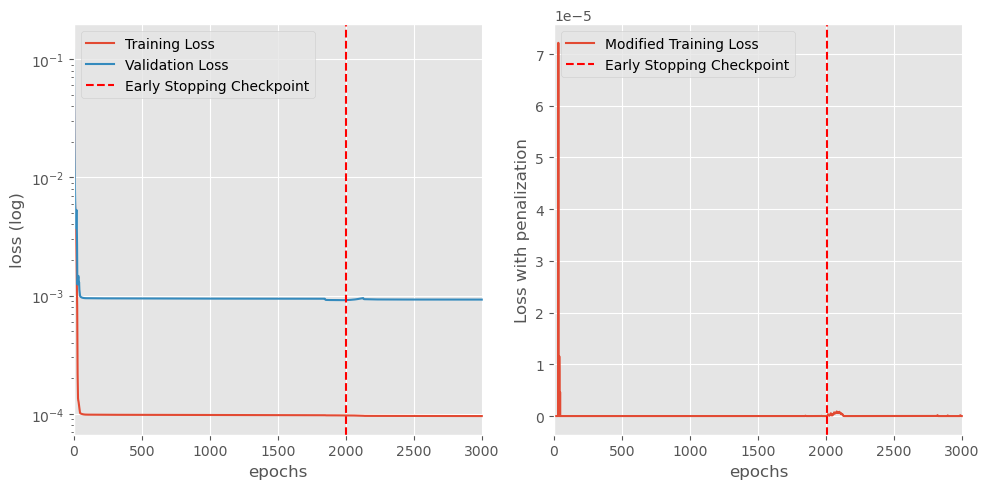

MSE Train: 9.7e-05, MSE Val: 0.0009157, MSE Test: 0.0005885
RMSE Train: 0.0098514, RMSE Val: 0.0302603 , RMSE Test: 0.0242598
MAE Train: 0.0088116, MAE Val: 0.0255922, MAE Test: 0.0164641
R2 Train: 0.9984568, R2 Val: 0.9860753, R2 Test: 0.9934977


In [30]:
## TRAINING
torch.manual_seed(0)
if not os.path.exists('../Models'):
    os.makedirs('../Models')
    
with open('../Scripts/config.yaml') as f:
    config = yaml.load(f, Loader=yaml.FullLoader)
print(config)
NN_Monotonic = train(config)
model = NN_Monotonic._model
Utilities.print_errors(model,X_train_tensor,y_train_tensor,X_test_tensor,y_test_tensor, X_val_ext,y_val_ext)

In [ ]:
# MSE Train: 9.7e-05, MSE Val: 0.0009157, MSE Test: 0.0005885
# RMSE Train: 0.0098514, RMSE Val: 0.0302603 , RMSE Test: 0.0242598
# MAE Train: 0.0088116, MAE Val: 0.0255922, MAE Test: 0.0164641
# R2 Train: 0.9984568, R2 Val: 0.9860753, R2 Test: 0.9934977

In [8]:
NN_Monotonic._plot_surface_interactive(X_train_tensor,y_train_tensor,0,1)

/Users/alejandropolo/opt/anaconda3/envs/pytorch/lib/python3.10/site-packages/torch/functional.py:478: UserWarning:

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_2a19nf9hj1/croot/pytorch_1675190251927/work/aten/src/ATen/native/TensorShape.cpp:2895.)



In [9]:
###### JACOBIAN PLOT
x_lim = config['data_load']['x_lim']
y_lim = config['data_load']['y_lim']
model = NN_Monotonic._model
# Generate the data
n_samples = 3
X1 = np.linspace(x_lim[0], x_lim[1], n_samples)
X2 = np.linspace(y_lim[0], y_lim[1], n_samples)
X1, X2 = np.meshgrid(X1, X2)
matr = np.column_stack((X1.ravel(), X2.ravel()))
input_matrix = torch.tensor(matr, dtype=torch.float32)

with torch.no_grad():
    Y = model(input_matrix).reshape(X1.shape)
NN_Monotonic._plot_jacobian_interactive(X_train_tensor,0,1,0)
NN_Monotonic._plot_jacobian_interactive(X_train_tensor,0,1,1)

# VORONOI CHECK

In [31]:
### Compute Lipstchiz Constant
## Take one input and output random (it does not matter since the objective is to bound the Hessian for all inputs)
x = train_dataload.dataset.tensors[0][0].view(1,-1)
y = train_dataload.dataset.tensors[1][0].view(1,-1)

weights, biases = LipVor_functions.get_weights_and_biases(model)
# Just extract the weights and biases from the model independently of the activation functions
W, Z, O, D, D2, D_accum, Q, H, counter, mlpstr = calculate_second_partial_derivatives_mlp(weights,
                                                                                          biases,
                                                                                          ['identity', 'sigmoid', 'identity'],
                                                                                          x, y,
                                                                                          sens_end_layer=len(config['model_architecture']['actfunc']))

## Calculate the Hessian for the first input
global_lipschitz_constant = LipVor_functions.hessian_bound(W=W, actfunc=config['model_architecture']['actfunc'], partial_monotonic_variable=[0], n_variables=2)
print('Lipschitz Upper Bound: ', global_lipschitz_constant)

Lipschitz Upper Bound:  17.14092623940184


In [32]:
# Lipschitz Upper Bound:  17.14092623940184

Execution time: 0.0035619735717773438


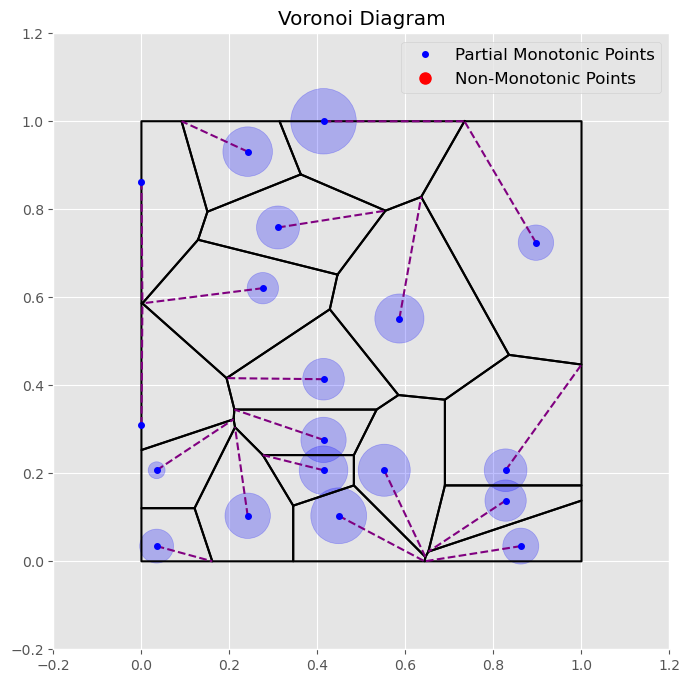

The space is filled: False


In [33]:
##### PLOT VORONOI OF THE INITIAL 10 POINTS #####
import importlib

torch.manual_seed(0)
np.random.seed(0)
## Select n random points
n_points = len(X_train_tensor)
selected_index = torch.randperm(len(X_train_tensor))[:n_points]
original_points = X_train_tensor[selected_index].numpy()
original_points_y = y_train_tensor[selected_index].numpy()
inputs = torch.tensor(original_points,dtype=torch.float)
outputs = torch.tensor(original_points_y,dtype=torch.float)
outputs = []
x_lim = config['data_load']['x_lim']
y_lim = config['data_load']['y_lim']


## Generate vertices for a hypercube (n-dimensional cube) defined by the given interval
epsilon = 0.0001
intervals = [(x_lim[0], x_lim[1]), (y_lim[0], y_lim[1])]
vertices = LipVor_functions.generate_hypercube_vertices(intervals)
intervals_extended = [(x_lim[0]-epsilon, x_lim[1]+epsilon), (y_lim[0]-epsilon, y_lim[1]+epsilon)]
vertices_extended = LipVor_functions.generate_hypercube_vertices(intervals_extended)
## Define the coordinates of the square's vertices
square_vertices = np.array([[x_lim[0],y_lim[0]],[x_lim[0],y_lim[1]],[x_lim[1],y_lim[1]],[x_lim[1],y_lim[0]],[x_lim[0],y_lim[0]]])


## Compute original Voronoi diagram
original_vor = Voronoi(original_points,incremental=True)

## Compute symmetric points
all_points, _ = LipVor_functions.add_symmetric_points(original_vor,vertices_extended,intervals_extended)

## Compute Voronoi diagram with symmetric points (and therefore bounded)
finite_vor = Voronoi(all_points,incremental=True)

## Compute the radios for each point
start_time = time.time()


radius_tot,dict_radios,x_reentrenamiento,_ = LipVor_functions.get_lipschitz_radius_neuralsens(inputs=inputs,outputs=outputs,weights=weights,biases=biases,
                                actfunc=config['model_architecture']['actfunc'],global_lipschitz_constant=global_lipschitz_constant,
                                monotone_relation=[1],variable_index=[0],n_variables=2,epsilon_derivative=0.1)
end_time = time.time()
print('Execution time: {}'.format(end_time-start_time))
## Load derivative sign
derivative_sign = [v[1] for k,v in dict_radios.items()]

## Plot Voronoi diagram
if not np.all(radius_tot == np.array(list(dict_radios.values()))[:,0]):
    print('Radii do not match')
radios = np.array(list(dict_radios.values()))[:,0]
LipVor_functions.plot_finite_voronoi_2D(finite_vor,all_points,original_points,radios,square_vertices,derivative_sign=derivative_sign,plot_symmetric_points=False)
## Check if the space is filled
space_filled, distances = LipVor_functions.check_space_filled_vectorized(finite_vor,dict_radios,vertices)
print('The space is filled: {}'.format(space_filled))

Using NeuralSens


Processing iteration 21:   2%|▏         | 18/800 [00:00<00:32, 24.33it/s, Percentage of vertex covered=18.42%, Percentage of Volume Verified=3.47%]

The retraining set is not empty and therefore the space cannot be filled


Processing iteration 800: 100%|██████████| 800/800 [03:49<00:00,  3.48it/s, Percentage of vertex covered=43.89%, Percentage of Volume Verified=71.19%]


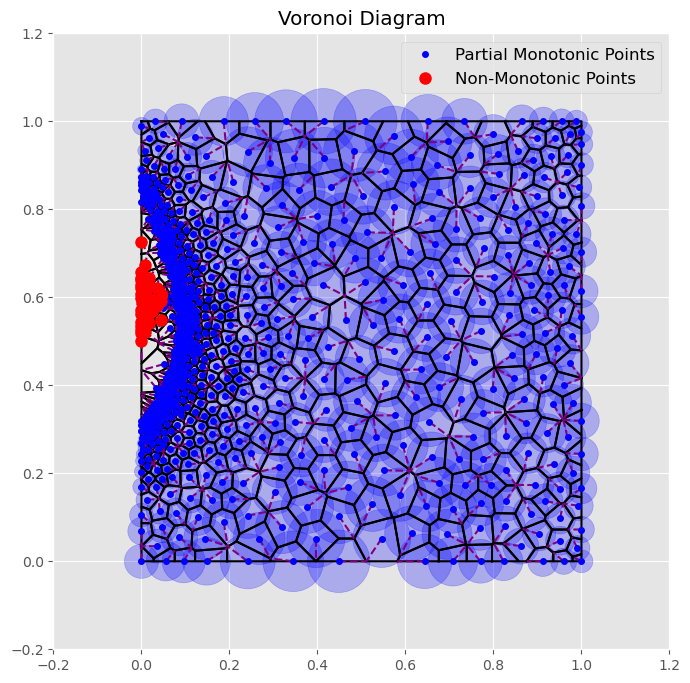

In [13]:
### VECTORIZED
importlib.reload(LipVor_functions)
x_reentrenamiento=LipVor_functions.LipVor(original_vor=original_vor,original_points=original_points,finite_vor=finite_vor,
                                                          dict_radios=dict_radios,vertices=vertices,distances=distances,model=model,
                                                          global_lipschitz_constant=global_lipschitz_constant,actfunc=config['model_architecture']['actfunc'],
                                                          intervals=intervals,monotone_relations=[1],variable_index=[0],n_variables=2,epsilon_derivative = 0.1,probability=0.1,
                                                          plot_voronoi=False, epsilon=1e-5,max_iterations=800)

In [14]:
len(x_reentrenamiento)

77

# RETRAINING

In [15]:
import copy
torch.manual_seed(0)
np.random.seed(0)
### model -> Contains the last trained model
model_non_mono = copy.deepcopy(NN_Monotonic._model)


{'data_load': {'n_samples': 8, 'noise_constant': 0.05, 'x_lim': [0, 1], 'y_lim': [0, 1.0]}, 'model_architecture': {'actfunc': ['tanh'], 'batch_size': None, 'layers': [2, 10, 1]}, 'training': {'delta': 0.1, 'delta_external': 0.1, 'delta_synthetic': 0.0, 'epsilon_synthetic': 0.0, 'epsilon': 0.1, 'learning_rate': 0.01, 'monotone_relations': [1, 0], 'n_epochs': 5000, 'patience': 1000, 'plot_history': True, 'save_model': True, 'early_stopping': False, 'std_growth': 0.0, 'verbose': 1, 'weight_decay': 0.0, 'seed': 0, 'optimizer_type': 'LBFGS'}}


[5000/5000]: 100%|██████████| 5001/5001 [01:12<00:00, 69.23it/s, Train Loss=0.000208, Train Loss Mod=0.000208, Val Loss=0.00131] 


5001


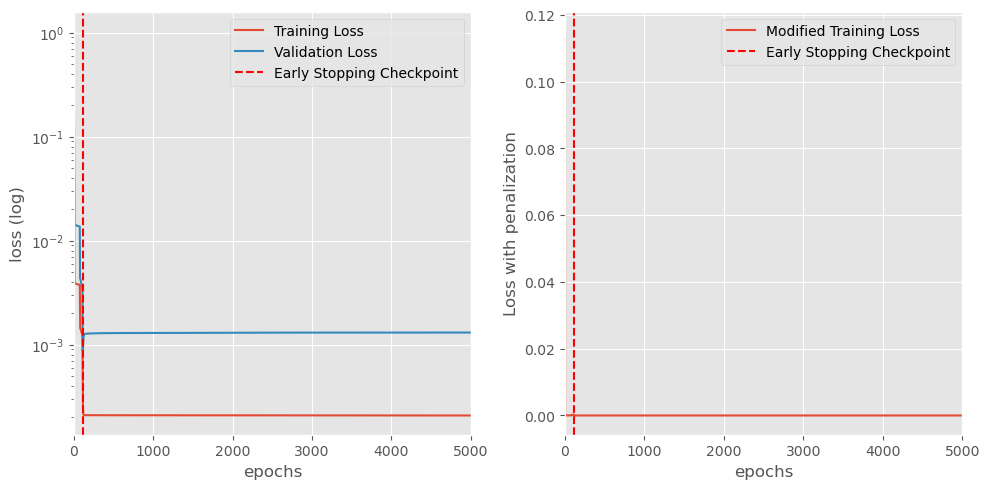

MSE Train: 0.0002079, MSE Val: 0.0013053, MSE Test: 0.0004292
RMSE Train: 0.0144198, RMSE Val: 0.0361295 , RMSE Test: 0.0207163
MAE Train: 0.012951, MAE Val: 0.030513, MAE Test: 0.0166967
R2 Train: 0.9966937, R2 Val: 0.9801499, R2 Test: 0.9952585


In [16]:
torch.manual_seed(0)
if not os.path.exists('./Models'):
    os.makedirs('./Models')
with open('../Scripts/config.yaml') as f:
    config = yaml.load(f, Loader=yaml.FullLoader)
config['training']['delta_external'] = 0.1
config['training']['early_stopping'] = False ## No early stopping as the initial model is already trained
config['training']['learning_rate'] = 0.01
print(config)
NN_Monotonic_mono1 = train(config,external_points=x_reentrenamiento,model=model_non_mono)
model_mono = NN_Monotonic_mono1._model
Utilities.print_errors(model_mono,X_train_tensor,y_train_tensor,X_test_tensor,y_test_tensor, X_val_ext,y_val_ext)

In [ ]:
# MSE Train: 0.0002079, MSE Val: 0.0013053, MSE Test: 0.0004292
# RMSE Train: 0.0144198, RMSE Val: 0.0361295 , RMSE Test: 0.0207163
# MAE Train: 0.012951, MAE Val: 0.030513, MAE Test: 0.0166967
# R2 Train: 0.9966937, R2 Val: 0.9801499, R2 Test: 0.9952585

In [18]:
  ###### JACOBIAN PLOT
x_lim = config['data_load']['x_lim']
y_lim = config['data_load']['y_lim']

# Generate the data
n_samples = 3
X1 = np.linspace(x_lim[0], x_lim[1], n_samples)
X2 = np.linspace(y_lim[0], y_lim[1], n_samples)
X1, X2 = np.meshgrid(X1, X2)
matr = np.column_stack((X1.ravel(), X2.ravel()))
input_matrix = torch.tensor(matr, dtype=torch.float32)

with torch.no_grad():
    Y = model_mono(input_matrix).reshape(X1.shape)
NN_Monotonic_mono1._plot_jacobian_interactive(X_train_tensor,0,1,0)
NN_Monotonic_mono1._plot_jacobian_interactive(X_train_tensor,0,1,1)

In [19]:
NN_Monotonic_mono1._plot_surface_interactive(X_train_tensor,y_train_tensor,0,1)

In [20]:
### Compute Lipstchiz Constant
x = train_dataload.dataset.tensors[0][0].view(1,-1)
y = train_dataload.dataset.tensors[1][0].view(1,-1)

weights, biases = LipVor_functions.get_weights_and_biases(model_mono)

# Just extract the weights and biases from the model independently of the activation functions
W, Z, O, D, D2, D_accum, Q, H, counter, mlpstr = calculate_second_partial_derivatives_mlp(weights,
                                                                                          biases,
                                                                                          #config['model_architecture']['actfunc'],
                                                                                          ['identity', 'sigmoid', 'identity'],
                                                                                          x, y,
                                                                                          sens_end_layer=len(config['model_architecture']['actfunc']))

## Calculate the Hessian for the first input
global_lipschitz_constant = LipVor_functions.hessian_bound(W=W, actfunc=config['model_architecture']['actfunc'], partial_monotonic_variable=[0], n_variables=2)
print('Lipschitz Upper Bound: ', global_lipschitz_constant)

Lipschitz Upper Bound:  16.881870086029522


In [21]:
# Lipschitz Upper Bound:  16.881870086029522


Tiempo de ejecución: 0.0040171146392822266


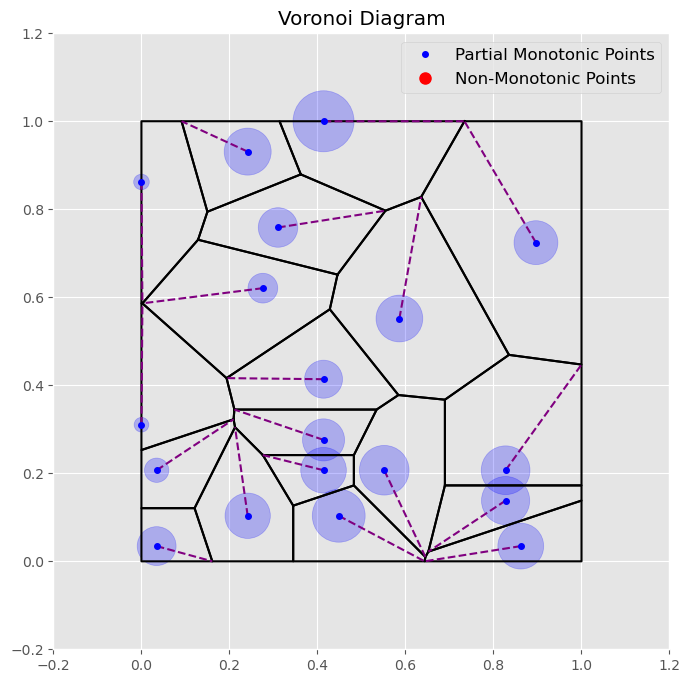

The space is filled: False


In [22]:
##### PLOT VORONOI WITH FURTHEST POINTS #####

torch.manual_seed(0)
np.random.seed(0)
n_points = len(X_train_tensor)
selected_index = torch.randperm(len(X_train_tensor))[:n_points]
original_points = X_train_tensor[selected_index].numpy()
inputs = torch.tensor(original_points,dtype=torch.float)
outputs = []
x_lim = config['data_load']['x_lim']
y_lim = config['data_load']['y_lim']


## Generate vertices for a hypercube (n-dimensional cube) defined by the given interval
epsilon = 0.0001
intervals = [(x_lim[0], x_lim[1]), (y_lim[0], y_lim[1])]
vertices = LipVor_functions.generate_hypercube_vertices(intervals)
intervals_extended = [(x_lim[0]-epsilon, x_lim[1]+epsilon), (y_lim[0]-epsilon, y_lim[1]+epsilon)]
vertices_extended = LipVor_functions.generate_hypercube_vertices(intervals_extended)
## Define the coordinates of the square's vertices
square_vertices = np.array([[x_lim[0],y_lim[0]],[x_lim[0],y_lim[1]],[x_lim[1],y_lim[1]],[x_lim[1],y_lim[0]],[x_lim[0],y_lim[0]]])


## Compute original Voronoi diagram
original_vor = Voronoi(original_points,incremental=True)

## Compute symmetric points
all_points, _ = LipVor_functions.add_symmetric_points(original_vor,vertices_extended,intervals_extended)

## Compute Voronoi diagram with symmetric points (and therefore bounded)
finite_vor = Voronoi(all_points,incremental=True)

## Compute the radios for each point
start_time = time.time()


radius_tot,dict_radios,x_reentrenamiento,_ = LipVor_functions.get_lipschitz_radius_neuralsens(inputs=inputs,outputs=outputs,weights=weights,biases=biases,
                                actfunc=config['model_architecture']['actfunc'],global_lipschitz_constant=global_lipschitz_constant,
                                monotone_relation=[1],variable_index=[0],n_variables=2,epsilon_derivative=0.1)
end_time = time.time()
print('Tiempo de ejecución: {}'.format(end_time-start_time))
## Load derivative sign
derivative_sign = [v[1] for k,v in dict_radios.items()]

## Plot Voronoi diagram
if not np.all(radius_tot == np.array(list(dict_radios.values()))[:,0]):
    print('Radii do not match')
radios = np.array(list(dict_radios.values()))[:,0]
LipVor_functions.plot_finite_voronoi_2D(finite_vor,all_points,original_points,radios,square_vertices,derivative_sign=derivative_sign,plot_symmetric_points=False)
## Check if the space is filled
space_filled, distances = LipVor_functions.check_space_filled_vectorized(finite_vor,dict_radios,vertices)
print('The space is filled: {}'.format(space_filled))

Using NeuralSens


Processing iteration 696:  87%|████████▋ | 695/800 [03:48<00:34,  3.04it/s, Percentage of vertex covered=99.86%, Percentage of Volume Verified=99.99%]

The space is filled: True after 696 iterations 


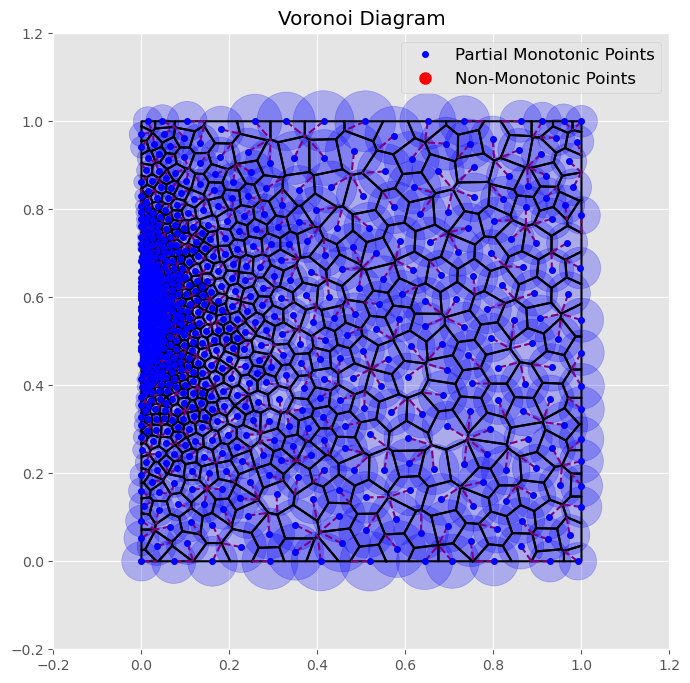

In [23]:
### VECTORIZED
importlib.reload(LipVor_functions)
x_reentrenamiento=LipVor_functions.LipVor(original_vor=original_vor,original_points=original_points,finite_vor=finite_vor,
                                                          dict_radios=dict_radios,vertices=vertices,distances=distances,model=model_mono,
                                                          global_lipschitz_constant=global_lipschitz_constant,actfunc=config['model_architecture']['actfunc'],
                                                          intervals=intervals,monotone_relations=[1],variable_index=[0],n_variables=2,epsilon_derivative = 0.1,probability=0.1,
                                                          plot_voronoi=False, epsilon=1e-5,max_iterations=800)